In [1]:
%pip install ibmpairs
%pip install configparser
%pip install matplotlib
%pip install ipyplot

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [10]:
import ibmpairs.client as client
import ibmpairs.catalog as catalog
import ibmpairs.query as query
import pandas as pd
import configparser
import json
import numpy as np
from PIL import Image as PILImage
from IPython.display import Image, display
import matplotlib.pyplot as plt
import os
import ipyplot

In [11]:
config = configparser.RawConfigParser()
config.read('/Users/sharmisthaa/Documents/GitHub/GeoGenesis/auth/secrets.ini')

EI_API_KEY    = config.get('EI', 'api.api_key')
EI_TENANT_ID  = config.get('EI', 'api.tenant_id') 
EI_ORG_ID     = config.get('EI', 'api.org_id')  

EI_client_v3  = client.get_client(api_key   = EI_API_KEY,
                                    tenant_id = EI_TENANT_ID,
                                    org_id    = EI_ORG_ID,
                                    legacy    = False,
                                    version   = 3
                                   )

2025-03-22 21:54:47 - paw - INFO - The client authentication method is assumed to be OAuth2.
2025-03-22 21:54:47 - paw - INFO - Legacy Environment is False
2025-03-22 21:54:47 - paw - INFO - The authentication api key type is assumed to be IBM EIS, because the api key prefix 'PHX' is present.
2025-03-22 21:54:51 - paw - INFO - Authentication success.
2025-03-22 21:54:51 - paw - INFO - HOST: https://api.ibm.com/geospatial/run/na/core/v3


In [12]:
pd.set_option('display.max_colwidth', None)
search_df=catalog.search("Soil properties and soil profile data")
search_df[['dataset_id','data_layer_id','data_layer_name','data_layer_description_short',
           'data_layer_level','data_layer_type','data_layer_unit','data_set_name','data_set_description_short']]

,dataset_id,data_layer_id,data_layer_name,data_layer_description_short,data_layer_level,data_layer_type,data_layer_unit,data_set_name,data_set_description_short
0,62,50492,Bulk density,Bulk density (g/cm3) of the fine earth fraction (<2mm).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
1,62,50493,Sand,Proportion of sand particles (> 0.05 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
2,62,50494,Clay,Proportion of clay particles (< 0.002 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
3,62,50495,Silt,Proportion of silt particles (greater than or equal to 0.002 mm and less than or equal to 0.05 mm) in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
4,62,50496,pH,Soil pH (in water).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
5,62,50497,Soil organic carbon,Soil organic carbon content in the fine earth fraction.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
6,62,50498,Organic carbon density,Organic carbon density.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
7,62,50506,Organic carbon stocks,Organic carbon stocks (0-30cm depth),18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
8,62,50507,Cation exchange capacity,Cation exchange capacity of the soil.,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.
9,62,50508,Coarse fragments,Volumetric fraction of coarse fragments (> 2 mm).,18,Raster,,Soil properties and soil profile data,Soil property maps that include soil profile information from 0 to 200cm. Predictions are made at six standard depths.


In [13]:
soilgrids_result = query.submit_check_status_and_download(
    {
        "publish": True,
        "name": "Soilgrids Raster Query",
        "spatial": {
            "type": "square",
             "coordinates": [9.417, 49.388, 10.227, 49.914]
        },
        "temporal": {
            "intervals": [
                {
                    "start": "2019-12-05T00:00:00",
                    "end": "2019-12-05T00:00:00"
                }
            ]
        },
        "layers": [
            {
                "type": "raster",
                "id": "50492",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50493",
                "dimensions": [{"name": "depth","value": "5to15cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50494",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50495",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q95"}]
            },
            {
                "type": "raster",
                "id": "50496",
                "dimensions": [{"name": "depth","value": "15to30cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50497",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50498",
                "dimensions": [{"name": "depth","value": "100to200cm"},{"name": "quantile","value": "q05"}]
            },
            {
                "type": "raster",
                "id": "50506",
                "dimensions": [{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50507",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50508",
                "dimensions": [{"name": "depth","value": "30to60cm"},{"name": "quantile","value": "q50"}]
            },
            {
                "type": "raster",
                "id": "50509",
                "dimensions": [{"name": "depth","value": "60to100cm"},{"name": "quantile","value": "mean"}]
            },
            {
                "type": "raster",
                "id": "50510",
                "dimensions": [{"name": "rsg","value": "fluvisols"}]
            },
            {
                "type": "raster",
                "id": "50511"
            }
        ]
    }, client=EI_client_v3)

2025-03-22 21:55:04 - paw - INFO - TASK: submit_check_status_and_download STARTING.
2025-03-22 21:55:07 - paw - INFO - The query was successfully submitted with the id: 1742644800_15907011.
2025-03-22 21:55:08 - paw - INFO - The query 1742644800_15907011 has the status Queued.
2025-03-22 21:55:39 - paw - INFO - The query 1742644800_15907011 has the status Running.
2025-03-22 21:56:10 - paw - INFO - The query 1742644800_15907011 has the status Succeeded.
2025-03-22 21:56:10 - paw - INFO - The query 1742644800_15907011 was successful after checking the status.
2025-03-22 21:56:42 - paw - INFO - The query 1742644800_15907011 has the status Succeeded.
2025-03-22 21:56:42 - paw - INFO - The query 1742644800_15907011 was successful after checking the status.
2025-03-22 21:56:42 - paw - INFO - The query download folder is set to the path /Users/sharmisthaa/Documents/GitHub/GeoGenesis/download/.
2025-03-22 21:56:47 - paw - INFO - The query 1742644800_15907011 is a zip.
2025-03-22 21:56:47 - pa

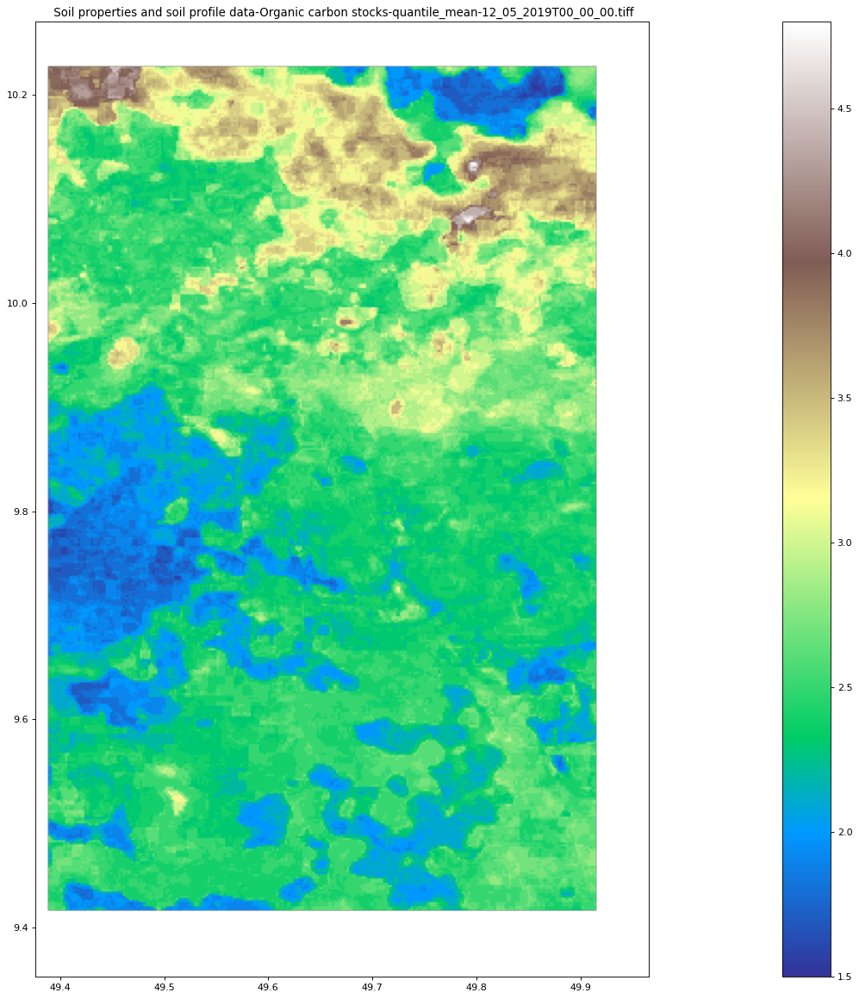

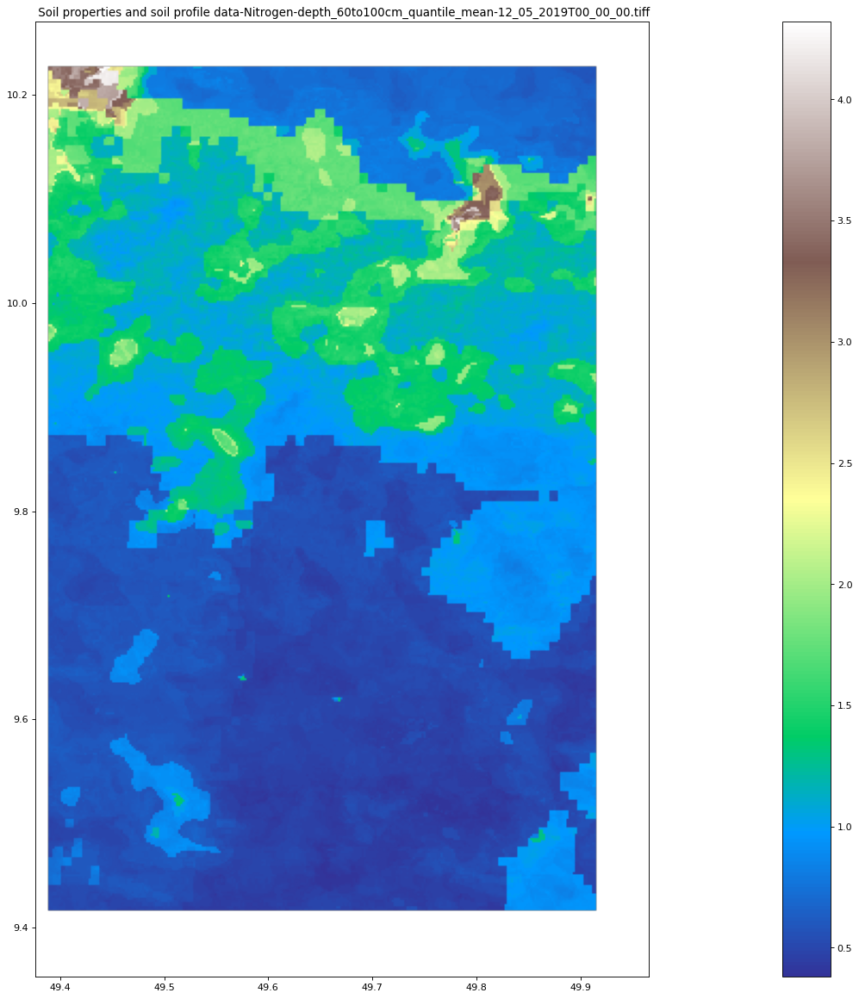

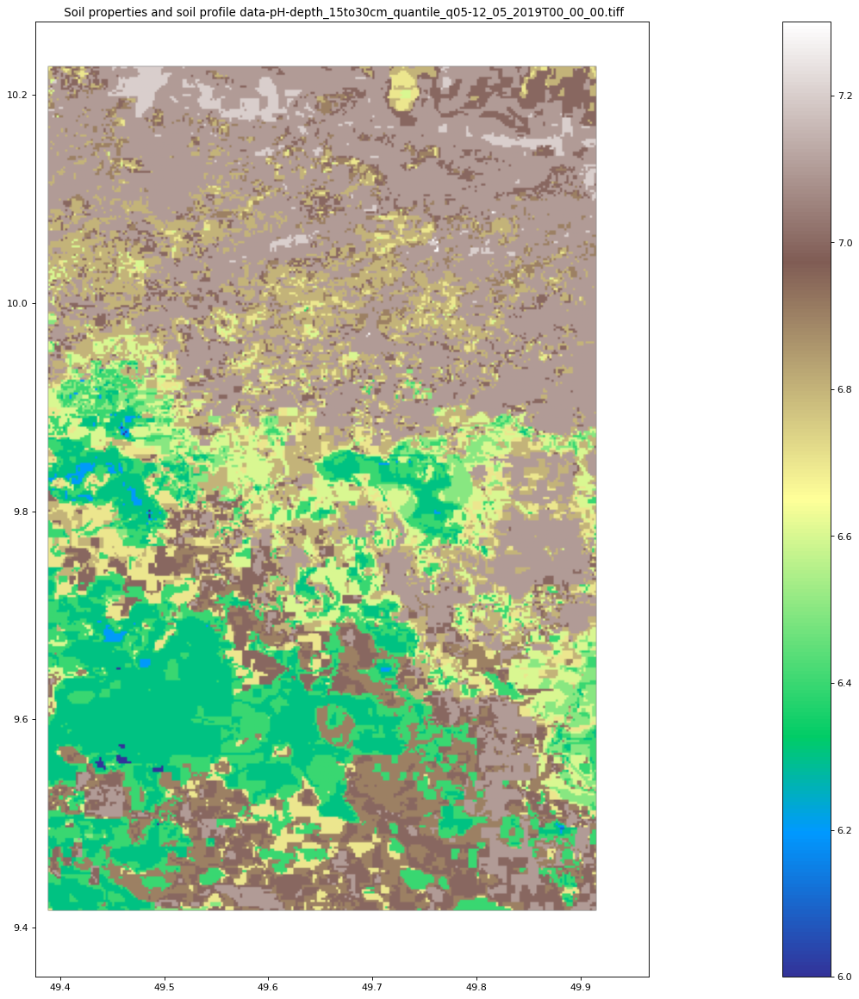

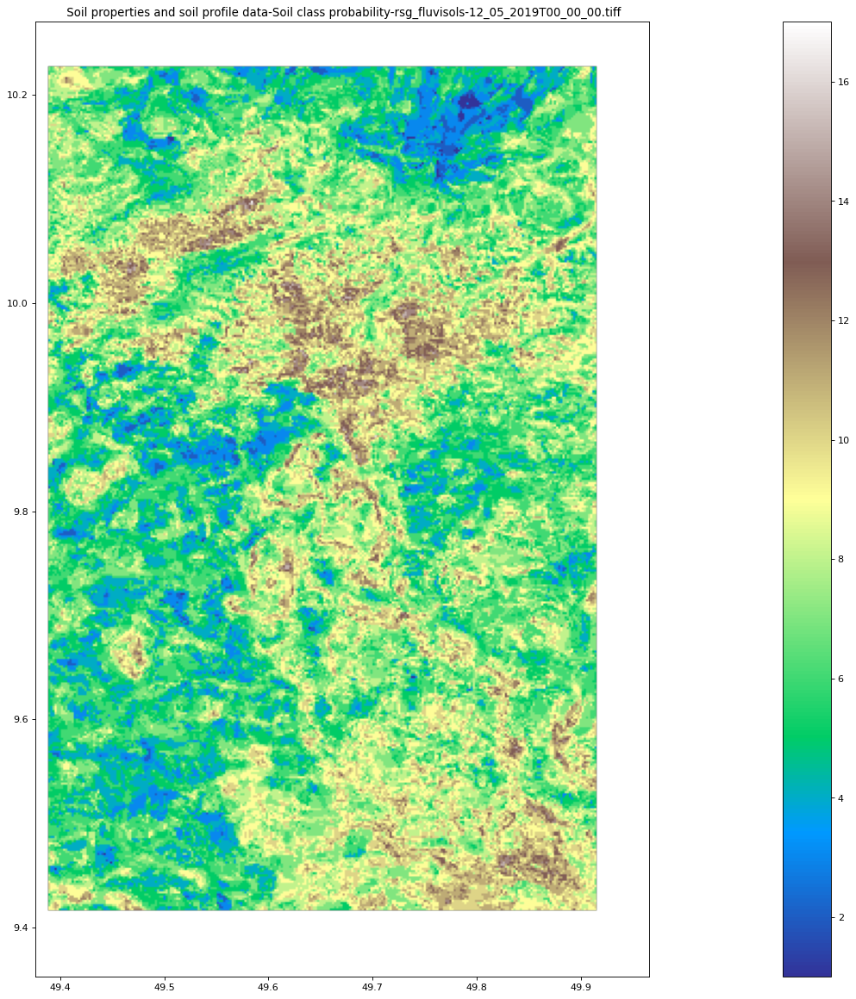

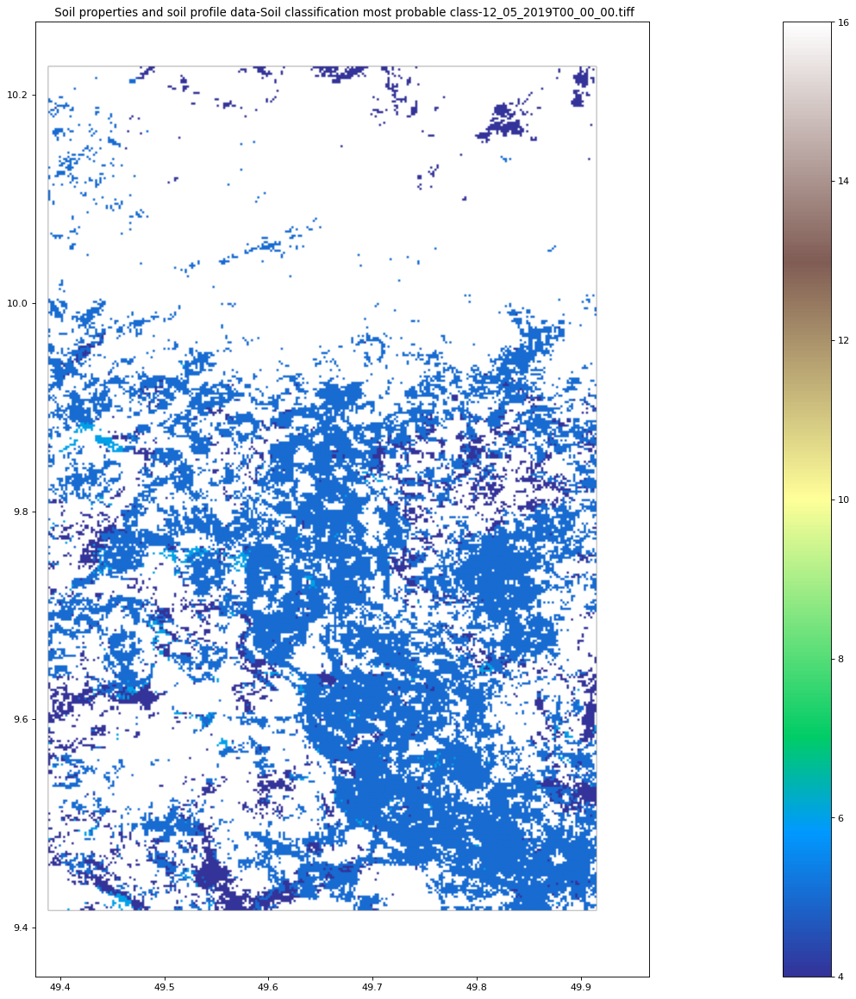

...

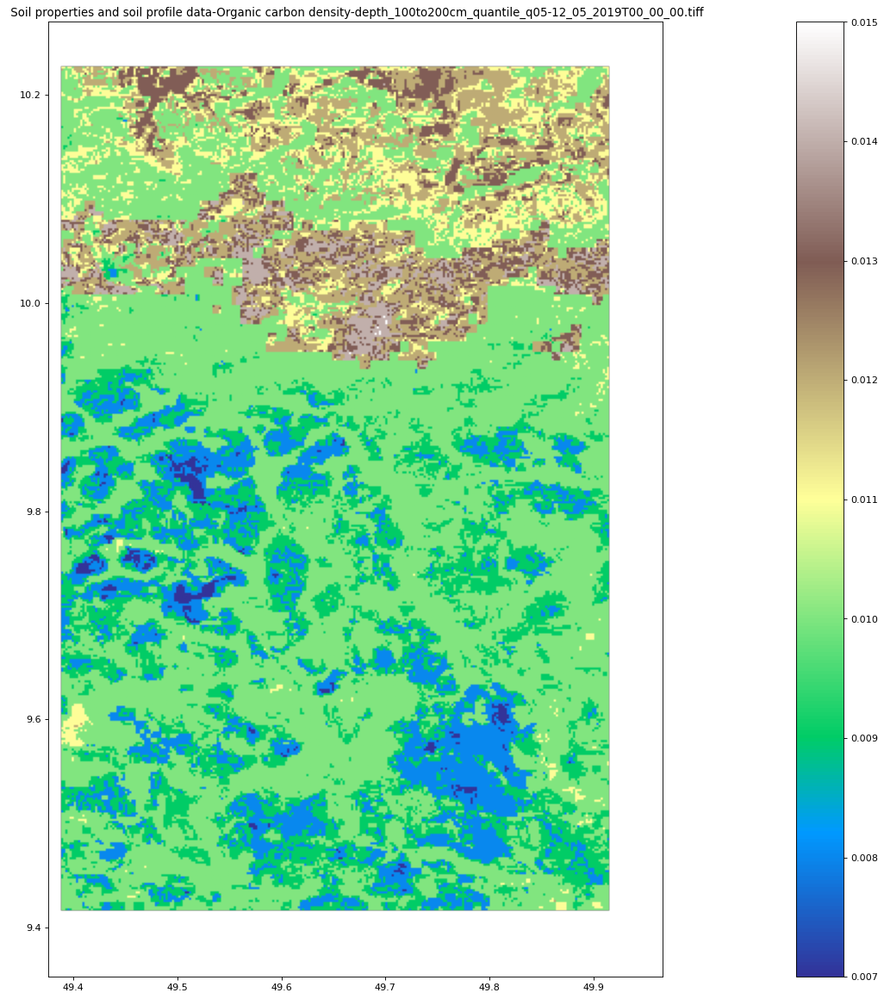

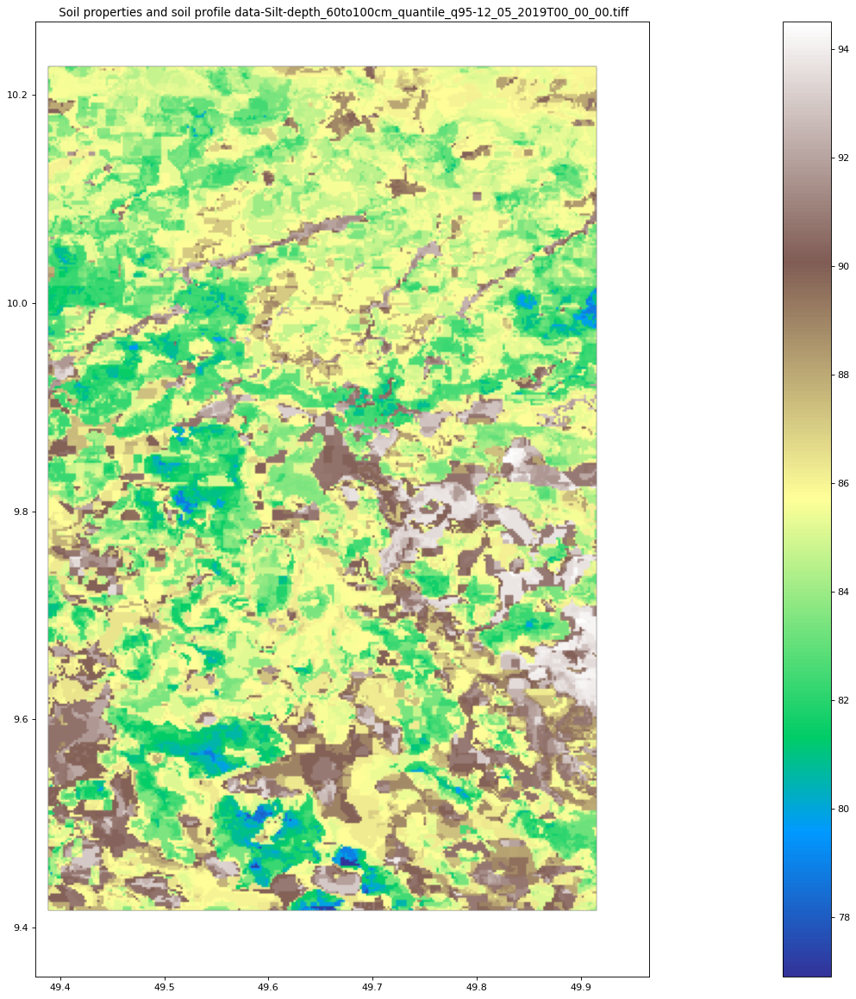

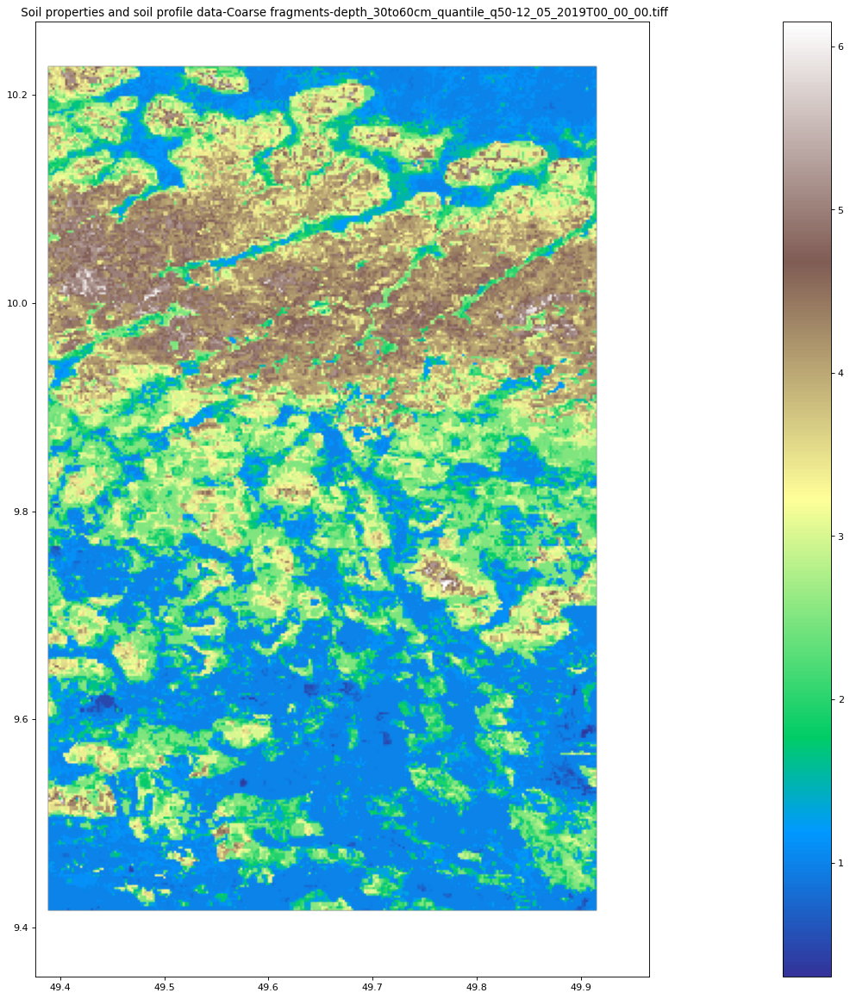

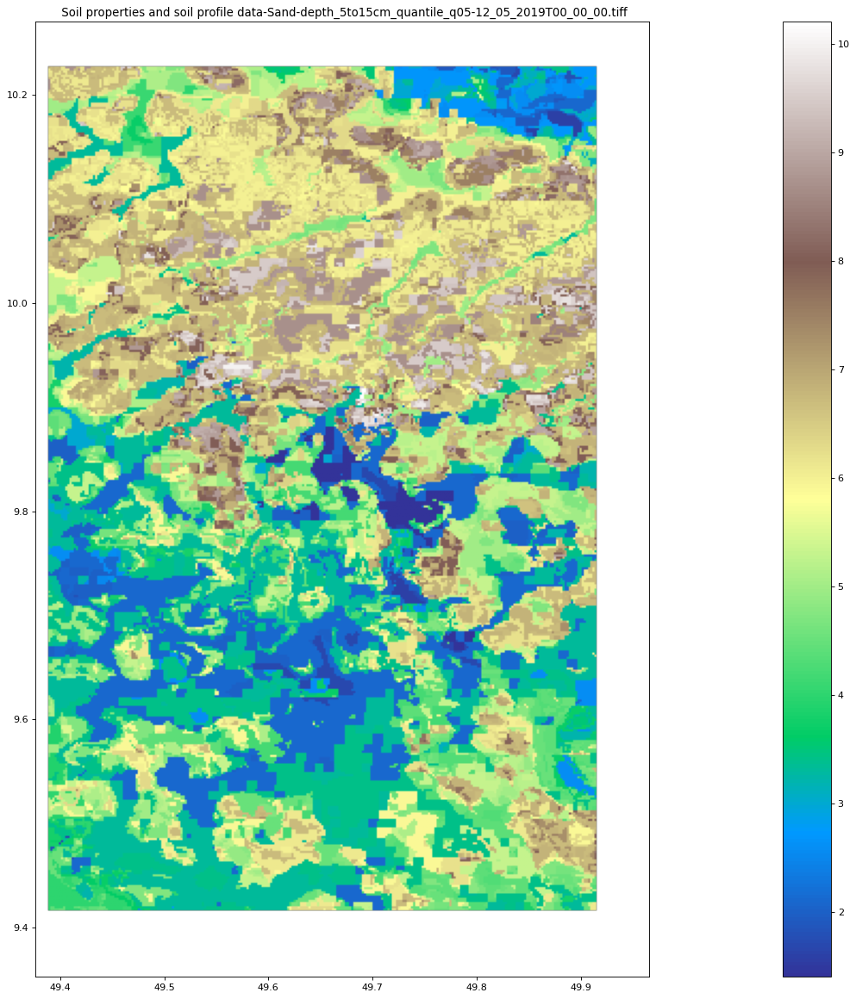

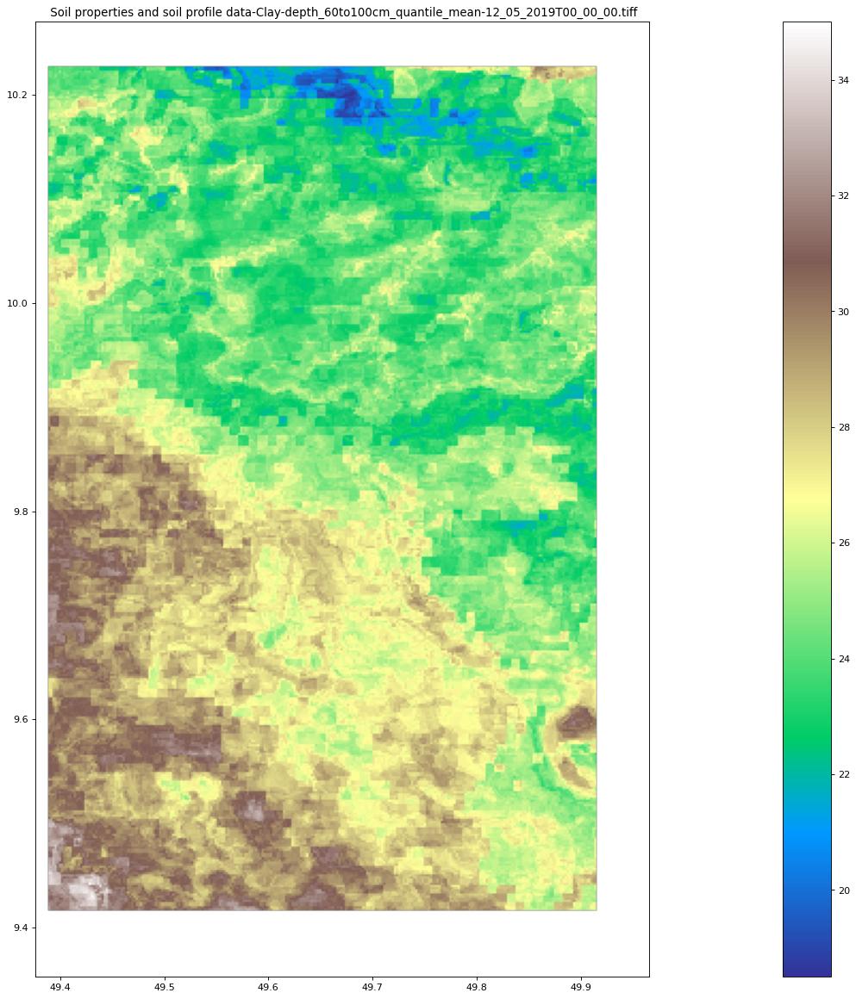

In [14]:
# Function to display the resulting Tiff(s).
soilgrids_file_list = soilgrids_result.list_files()
output_image_array = []
for file in soilgrids_file_list:
    if file.endswith('.tiff'): #display the raster images
        with open(file+'.json', 'r') as summary_file:
            fileparms = json.load(summary_file)
        boundingBox=fileparms["boundingBox"]
        pixelStatistics=fileparms["rasterStatistics"]
        myextent=[boundingBox["minLongitude"],
                  boundingBox["maxLongitude"],
                  boundingBox["minLatitude"],
                  boundingBox["maxLatitude" ] ]  
        array_soilgrids = np.array(PILImage.open(file))
        mask = (array_soilgrids == -9999)
        # Masked array to exclude NO Data points from plotting
        masked_array = np.ma.masked_array(array_soilgrids, mask)
        plt.figure(figsize = (50, 18), dpi=80) # Sets the size and resolution of the plot
        plt.imshow(masked_array,
                   cmap = 'terrain', 
                   vmin=pixelStatistics["pixelMin"], 
                   vmax=pixelStatistics["pixelMax"],
                   extent = myextent) # Loads the raster data and sets the colormap
        plt.colorbar() # Adds the color bar
        plt.title(" "+os.path.basename(file)) 
        output_image_path = os.path.splitext(os.path.basename(file))[0] + ".png"
        output_image_array.append(output_image_path)
        # Save the figure
        plt.savefig(output_image_path, bbox_inches='tight')
        plt.close() 

    
for output_image in output_image_array:
    #display the raster images
    display(Image(output_image, width=600, height=300))